In [2]:
import os
import torch

from torchvision.io import read_image
from torchvision.ops.boxes import masks_to_boxes
from torchvision import tv_tensors
from torchvision.transforms.v2 import functional as F
from torchvision.datasets import CocoDetection
from torchvision.transforms.functional import to_tensor

device = "cuda" if torch.cuda.is_available() else "cpu"

# PARAMETERS
NUM_CLASSES = 8 # 7 classes + background
BATCH_SIZE = 8
EPOCHS = 100

# Caminhos do dataset
ROOT_DIR = "./SVRDD_COCO"
TRAIN_DIRECTORY = os.path.join(ROOT_DIR, "train")
VAL_DIRECTORY = os.path.join(ROOT_DIR, "valid")
TEST_DIRECTORY = os.path.join(ROOT_DIR, "test")
ANNOTATION_FILE_NAME = "_annotations.coco.json" # Nome padrão do seu arquivo
CLASSES = {
    0: "longitudinal crack",
    1: "transverse crack",
    2: "alligator crack",
    3: "pothole",
    4: "manhole cover",
    5: "longitudinal patch",
    6: "transverse patch",
}

In [ ]:
class CocoDetectionCustom(CocoDetection):
    def __init__(self, image_directory_path: str):
        annotation_file_path = os.path.join(image_directory_path, ANNOTATION_FILE_NAME)
        super().__init__(image_directory_path, annotation_file_path)

    def __getitem__(self, idx):
        # super retorna (PIL Image, annotations list)
        img, anns = super().__getitem__(idx)

        # converte para Tensor float32 em [0,1]
        img = to_tensor(img)  # shape [C,H,W], dtype=float32

        boxes = []
        labels = []
        areas = []
        iscrowd = []

        for a in anns:
            xmin, ymin, w, h = a["bbox"]
            boxes.append([xmin, ymin, xmin + w, ymin + h])
            labels.append(a["category_id"])
            areas.append(w * h)
            iscrowd.append(a.get("iscrowd", 0))

        if len(boxes) == 0:
            # lidar com imagens sem anotações (opcional: pular na collate)
            boxes = torch.zeros((0,4), dtype=torch.float32)
            labels = torch.zeros((0,), dtype=torch.int64)
            areas = torch.zeros((0,), dtype=torch.float32)
            iscrowd = torch.zeros((0,), dtype=torch.int64)
        else:
            boxes = torch.tensor(boxes, dtype=torch.float32)
            labels = torch.tensor(labels, dtype=torch.int64)
            areas = torch.tensor(areas, dtype=torch.float32)
            iscrowd = torch.tensor(iscrowd, dtype=torch.int64)

        image_id = torch.tensor([int(self.ids[idx])])  # id do COCO

        target = {
            "boxes": boxes,
            "labels": labels,
        }

        return img, target

def collate_fn(batch):
    return tuple(zip(*batch))

train_dataset = CocoDetectionCustom(TRAIN_DIRECTORY)
val_dataset = CocoDetectionCustom(VAL_DIRECTORY)

train_data_loader = torch.utils.data.DataLoader(
    train_dataset,
    batch_size=BATCH_SIZE,
    shuffle=True,
    collate_fn=collate_fn,
    num_workers=8,        # ajusta conforme CPU (p.ex. os.cpu_count())
    pin_memory=True
)

valid_data_loader = torch.utils.data.DataLoader(
    val_dataset,
    batch_size=4,
    shuffle=False,
    collate_fn=collate_fn,
    num_workers=4,
    pin_memory=True
)

loading annotations into memory...
Done (t=0.08s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/home/andre/.pyenv/versions/fasterrcnn/lib/python3.10/site-packages/torch/utils/data/dataloader.py:557: UserWarning: This DataLoader will create 8 worker processes in total. Our suggested max number of worker in current system is 4, which is smaller than what this DataLoader is going to create. Please be aware that excessive worker creation might get DataLoader running slow or even freeze, lower the worker number to avoid potential slowness/freeze if necessary.
  warnings.warn(_create_warning_msg(


In [4]:
import torch

print("VRAM total:", torch.cuda.get_device_properties(0).total_memory / 1e9, "GB")
print("VRAM alocada:", torch.cuda.memory_allocated(0) / 1e9, "GB")
print("VRAM cache:", torch.cuda.memory_reserved(0) / 1e9, "GB")
print("VRAM livre aproximada:", (torch.cuda.get_device_properties(0).total_memory - torch.cuda.memory_reserved(0)) / 1e9, "GB")


VRAM total: 4.294836224 GB
VRAM alocada: 0.0 GB
VRAM cache: 0.0 GB
VRAM livre aproximada: 4.294836224 GB


In [5]:
import torch
import pytorch_lightning as pl
from torchvision.models.detection import fasterrcnn_resnet50_fpn
from torchvision.models.detection.faster_rcnn import FastRCNNPredictor
import json


class FasterRCNNLightning(pl.LightningModule):
    def __init__(self, num_classes, weights="DEFAULT", lr=0.005):
        super().__init__()
        self.save_hyperparameters()

        # carregar modelo pré-treinado
        self.model = fasterrcnn_resnet50_fpn(weights=weights)

        # substituir a head
        in_features = self.model.roi_heads.box_predictor.cls_score.in_features
        self.model.roi_heads.box_predictor = FastRCNNPredictor(
            in_features, num_classes
        )

    def forward(self, images):
        return self.model(images)

    def training_step(self, batch, batch_idx):
        images, targets = batch
        loss_dict = self.model(images, targets)
        loss = sum(loss_dict.values())

        self.log(
            "train_loss",
            loss,
            prog_bar=True,
            on_step=True,
            on_epoch=True
        )
        return loss

    def validation_step(self, batch, batch_idx):
        images, targets = batch
        images = list(image.to(device) for image in images)
        
        self.model.train()
        loss_dict = self.model(images, targets)
        loss = sum(loss_dict.values())

        self.log(
            "val_loss",
            loss,
            prog_bar=True,
            on_epoch=True,
            sync_dist=True
        )
        return loss

    def configure_optimizers(self):
        optimizer = torch.optim.SGD(
            self.parameters(),
            lr=self.hparams.lr,
            momentum=0.9,
            weight_decay=0.0005
        )

        lr_scheduler = torch.optim.lr_scheduler.StepLR(
            optimizer,
            step_size=3,
            gamma=0.1
        )

        return {
            "optimizer": optimizer,
            "lr_scheduler": lr_scheduler
        }

# Training

In [3]:
from pytorch_lightning.callbacks import ModelCheckpoint, EarlyStopping

# Defining Model
model = FasterRCNNLightning(num_classes=NUM_CLASSES)
model.to(device)


# Defining Callbacks and Logs
earlystop_cb = EarlyStopping(
    monitor="val_loss",   # era "validation_loss"
    patience=10,
    mode="min"
)

checkpoint_cb = ModelCheckpoint(
    monitor="val_loss",        # OK se você logar mAP em on_validation_epoch_end
    mode="min",
    save_top_k=2,
    filename="best-val-loss"
)

trainer = pl.Trainer(
    max_epochs=EPOCHS,
    accelerator="gpu",
    devices=1,
    precision="16",  # AMP habilitado
    callbacks=[checkpoint_cb, earlystop_cb],
    log_every_n_steps=10,
    enable_progress_bar=True,
    enable_checkpointing=True
)

# Training
trainer.fit(model, train_data_loader, valid_data_loader)

loading annotations into memory...
Done (t=0.07s)
creating index...
index created!
loading annotations into memory...
Done (t=0.01s)
creating index...
index created!


/usr/local/lib/python3.12/dist-packages/lightning_fabric/connector.py:571: `precision=16` is supported for historical reasons but its usage is discouraged. Please set your precision to 16-mixed instead!
Using 16bit Automatic Mixed Precision (AMP)
GPU available: True (cuda), used: True
TPU available: False, using: 0 TPU cores
/usr/local/lib/python3.12/dist-packages/torch/__init__.py:1551: UserWarning: Please use the new API settings to control TF32 behavior, such as torch.backends.cudnn.conv.fp32_precision = 'tf32' or torch.backends.cuda.matmul.fp32_precision = 'ieee'. Old settings, e.g, torch.backends.cuda.matmul.allow_tf32 = True, torch.backends.cudnn.allow_tf32 = True, allowTF32CuDNN() and allowTF32CuBLAS() will be deprecated after Pytorch 2.9. Please see https://pytorch.org/docs/main/notes/cuda.html#tensorfloat-32-tf32-on-ampere-and-later-devices (Triggered internally at /pytorch/aten/src/ATen/Context.cpp:80.)
  return _C._get_float32_matmul_precision()
You are using a CUDA device (

Sanity Checking: |          | 0/? [00:00<?, ?it/s]

/usr/local/lib/python3.12/dist-packages/pytorch_lightning/utilities/data.py:79: Trying to infer the `batch_size` from an ambiguous collection. The batch size we found is 3. To avoid any miscalculations, use `self.log(..., batch_size=batch_size)`.


Training: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

Validation: |          | 0/? [00:00<?, ?it/s]

# Evaluation

In [7]:
from torchvision import io, utils
from PIL import Image
import matplotlib.pyplot as plt


CHECKPOINT = "output_fasterrcnn/checkpoints/best-val-loss-v1.ckpt"

print("Loading Finetuned Model...")
model = FasterRCNNLightning.load_from_checkpoint(
    CHECKPOINT,
    num_classes=NUM_CLASSES,
    weights=None   # não carregue pesos COCO de novo!
).to(device)

Loading Finetuned Model...


Downloading: "https://download.pytorch.org/models/resnet50-0676ba61.pth" to /home/andre/.cache/torch/hub/checkpoints/resnet50-0676ba61.pth
100%|██████████| 97.8M/97.8M [00:10<00:00, 9.41MB/s]


loading annotations into memory...
Done (t=0.01s)
creating index...
index created!
Predicting...
Visualizing...
img_tensor = tensor([[[0.1843, 0.0824, 0.2157,  ..., 0.3373, 0.3373, 0.3373],
         [0.1373, 0.0745, 0.1529,  ..., 0.3373, 0.3373, 0.3373],
         [0.1843, 0.1569, 0.1686,  ..., 0.3490, 0.3490, 0.3490],
         ...,
         [0.3725, 0.3725, 0.3765,  ..., 0.0667, 0.0667, 0.0667],
         [0.3686, 0.3725, 0.3765,  ..., 0.0667, 0.0667, 0.0667],
         [0.3686, 0.3686, 0.3765,  ..., 0.0667, 0.0667, 0.0667]],

        [[0.3608, 0.2588, 0.3725,  ..., 0.5529, 0.5529, 0.5529],
         [0.3098, 0.2392, 0.3059,  ..., 0.5529, 0.5529, 0.5529],
         [0.3412, 0.3098, 0.3098,  ..., 0.5529, 0.5529, 0.5529],
         ...,
         [0.3333, 0.3333, 0.3373,  ..., 0.0627, 0.0627, 0.0627],
         [0.3294, 0.3333, 0.3373,  ..., 0.0627, 0.0627, 0.0627],
         [0.3294, 0.3294, 0.3373,  ..., 0.0627, 0.0627, 0.0627]],

        [[0.7569, 0.6157, 0.6471,  ..., 0.8745, 0.8745, 0.8745]

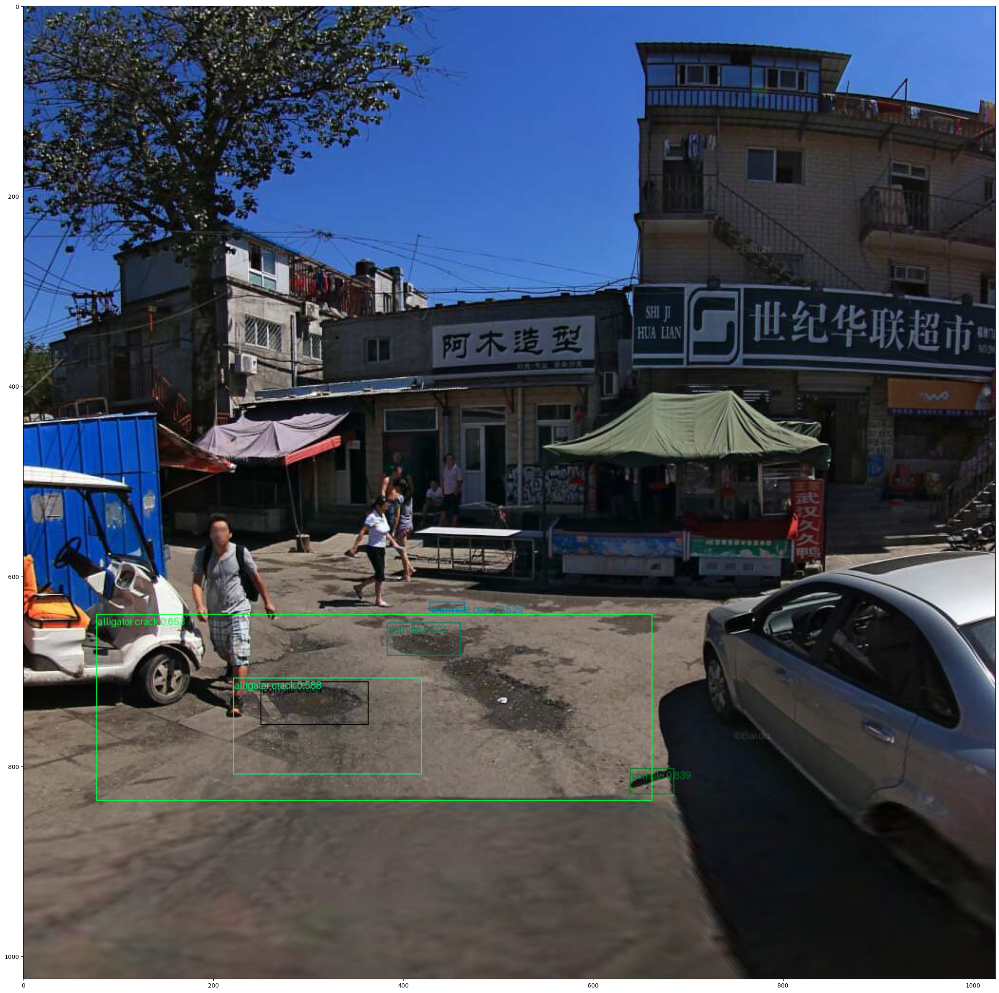

In [ ]:
from torchvision.transforms.functional import to_pil_image

image_id = 80
threshold = 0.5

# Loading Image and Annotation
test_dataset = CocoDetectionCustom(TEST_DIRECTORY)
img_tensor, target = test_dataset[image_id]

print("Predicting...")
model.eval()
img_tensor = img_tensor.to(device)
boxes, labels, scores = model([img_tensor])[0].values()

keep = scores >= threshold
boxes = boxes[keep]
labels = labels[keep]
scores = scores[keep]

print("Visualizing...")
# Visualize predictions.
image_with_boxes = utils.draw_bounding_boxes(
    image=(img_tensor * 255).to(torch.uint8),
    boxes=boxes,
    labels=[f"{CLASSES[label.item()]} {score:.3f}" for label, score in zip(labels, scores)],
)

fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(image_with_boxes.permute(1, 2, 0))
fig.savefig("predictions.png")
plt.show()

# Ground Truth

Visualizing...


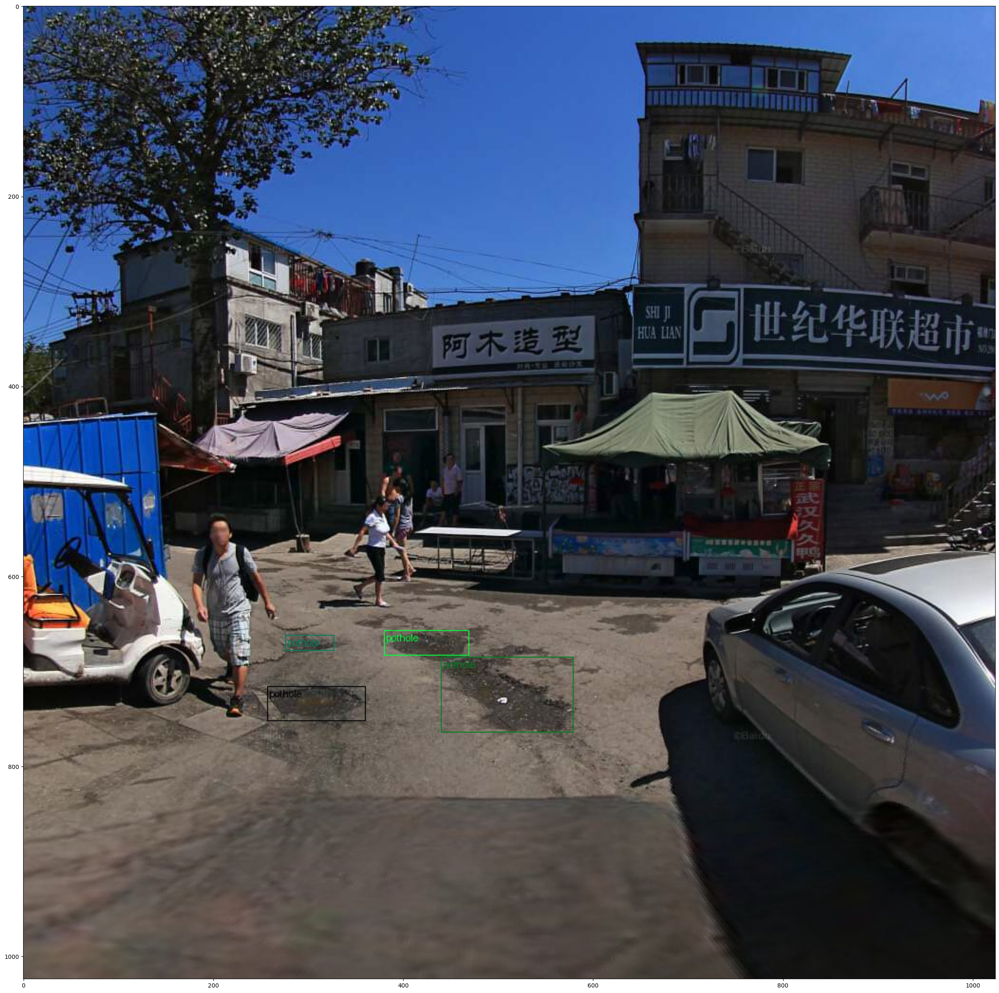

In [13]:
print("Visualizing...")
# Visualize predictions.
image_with_boxes = utils.draw_bounding_boxes(
    image=(img_tensor * 255).to(torch.uint8),
    boxes=target["boxes"],
    labels=[f"{CLASSES[label.item()]}" for label in target["labels"]],
)

fig, ax = plt.subplots(figsize=(30, 30))
ax.imshow(image_with_boxes.permute(1, 2, 0))
fig.savefig("ground_truth.png")
plt.show()

In [16]:
test_dataset[0]

(tensor([[[0.2431, 0.2431, 0.2431,  ..., 0.3961, 0.3961, 0.3961],
          [0.2431, 0.2431, 0.2431,  ..., 0.3961, 0.3961, 0.3961],
          [0.2431, 0.2431, 0.2431,  ..., 0.3961, 0.3961, 0.3961],
          ...,
          [0.5255, 0.5255, 0.5255,  ..., 0.4941, 0.4941, 0.4941],
          [0.5216, 0.5176, 0.5176,  ..., 0.4902, 0.4902, 0.4902],
          [0.5176, 0.5137, 0.5176,  ..., 0.4902, 0.4863, 0.4863]],
 
         [[0.4627, 0.4627, 0.4627,  ..., 0.6510, 0.6510, 0.6510],
          [0.4627, 0.4627, 0.4627,  ..., 0.6510, 0.6510, 0.6510],
          [0.4627, 0.4627, 0.4627,  ..., 0.6510, 0.6510, 0.6510],
          ...,
          [0.5059, 0.5059, 0.5059,  ..., 0.4784, 0.4784, 0.4784],
          [0.5020, 0.4980, 0.4980,  ..., 0.4745, 0.4745, 0.4745],
          [0.4980, 0.4941, 0.4980,  ..., 0.4745, 0.4706, 0.4706]],
 
         [[0.8431, 0.8431, 0.8431,  ..., 0.9647, 0.9647, 0.9647],
          [0.8431, 0.8431, 0.8431,  ..., 0.9647, 0.9647, 0.9647],
          [0.8431, 0.8431, 0.8431,  ...,

In [ ]:
from pycocotools.coco import COCO
from PIL import Image
import matplotlib.pyplot as plt
import numpy as np
from tqdm import tqdm


results = []

for img_id, (img, target) in enumerate(tqdm(test_dataset)):

    # formatar imagem
    img = img.to(device).unsqueeze(0)

    with torch.no_grad():
        outputs = model(img)[0]

    boxes = outputs["boxes"].cpu().numpy()
    scores = outputs["scores"].cpu().numpy()
    labels = outputs["labels"].cpu().numpy()

    # converter boxes para formato COCO: [x, y, w, h]
    boxes[:, 2] = boxes[:, 2] - boxes[:, 0]
    boxes[:, 3] = boxes[:, 3] - boxes[:, 1]

    # montar cada previsão
    for box, score, label in zip(boxes, scores, labels):
        results.append({
            "image_id": img_id + 1,  # COCO image ids começam em 1
            "category_id": int(label),
            "bbox": box.tolist(),
            "score": float(score)
        })
with open("detections.json", "w") as f:
    json.dump(results, f)

100%|██████████| 1000/1000 [04:10<00:00,  3.99it/s]


In [20]:
from pycocotools.coco import COCO
from pycocotools.cocoeval import COCOeval

GT_ANN_FILE = os.path.join(TEST_DIRECTORY, ANNOTATION_FILE_NAME)

# carregar ground truth
coco_gt = COCO(GT_ANN_FILE)

# carregar detecções
coco_dt = coco_gt.loadRes("detections.json")

# rodar avaliação
coco_eval = COCOeval(coco_gt, coco_dt, iouType="bbox")
coco_eval.evaluate()
coco_eval.accumulate()
coco_eval.summarize()

loading annotations into memory...
Done (t=0.02s)
creating index...
index created!
Loading and preparing results...
DONE (t=0.24s)
creating index...
index created!
Running per image evaluation...
Evaluate annotation type *bbox*
DONE (t=1.61s).
Accumulating evaluation results...
DONE (t=0.42s).
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=   all | maxDets=100 ] = 0.299
 Average Precision  (AP) @[ IoU=0.50      | area=   all | maxDets=100 ] = 0.552
 Average Precision  (AP) @[ IoU=0.75      | area=   all | maxDets=100 ] = 0.295
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= small | maxDets=100 ] = 0.169
 Average Precision  (AP) @[ IoU=0.50:0.95 | area=medium | maxDets=100 ] = 0.267
 Average Precision  (AP) @[ IoU=0.50:0.95 | area= large | maxDets=100 ] = 0.308
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets=  1 ] = 0.284
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets= 10 ] = 0.423
 Average Recall     (AR) @[ IoU=0.50:0.95 | area=   all | maxDets